### Gaussian Processes Practical Demonstration
https://www.youtube.com/watch?v=V1bF37-_ytQ

In [1]:
# Support for maths
import numpy as np
# Plotting tools
from matplotlib import pyplot as plt
# we use the following for plotting figures in jupyter
%matplotlib inline
# Importing data library
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# GPy: Gaussian processess libary
import GPy
from IPython.display import display

In [2]:
# Pembacaan File Data Polusi Udara ISPU Excel
DKI1 = pd.read_excel("./Data/Normalization/DATA ISPU - Normalization.xlsx", sheet_name="DKI1")

In [3]:
# Menampilkan 5 Data pertama DKI1
DKI1

,Tanggal,Wilayah,PM10,SO2,CO,O3,NO2,Max,Critical,Kategori
0,2017-01-01,DKI1 (Bunderan HI),0.719512,0.314286,0.458333,0.092308,0.012821,0.300518,PM10,Sedang
1,2017-01-02,DKI1 (Bunderan HI),0.146341,0.295238,0.270833,0.082051,0.000000,0.139896,SO2,Baik
2,2017-01-03,DKI1 (Bunderan HI),0.170732,0.295238,0.291667,0.087179,0.012821,0.139896,SO2,Baik
3,2017-01-04,DKI1 (Bunderan HI),0.243902,0.295238,0.395833,0.087179,0.012821,0.139896,SO2,Baik
4,2017-01-05,DKI1 (Bunderan HI),0.304878,0.295238,0.458333,0.056410,0.012821,0.139896,SO2,Baik
...,...,...,...,...,...,...,...,...,...,...
1760,2021-10-27,DKI1 (Bunderan HI),0.621951,0.266667,0.250000,0.097436,0.487179,0.367876,PM25,SEDANG
1761,2021-10-28,DKI1 (Bunderan HI),0.573171,0.257143,0.270833,0.097436,0.487179,0.331606,PM25,SEDANG
1762,2021-10-29,DKI1 (Bunderan HI),0.560976,0.285714,0.333333,0.076923,0.435897,0.305699,PM25,SEDANG
1763,2021-10-30,DKI1 (Bunderan HI),0.536585,0.285714,0.187500,0.112821,0.500000,0.326425,PM25,SEDANG


Train Test Data

In [4]:
# Predict 1 Bulan
train = DKI1.iloc[:-30]
test = DKI1.iloc[-30:]

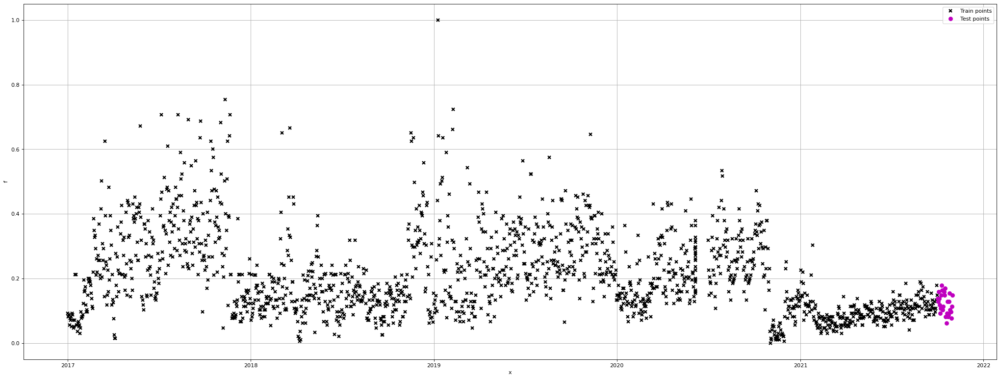

In [5]:
train_X, train_Y = np.array(train.index).reshape(-1, 1), np.array(train['O3']).reshape(-1, 1)
test_X, test_Y = np.array(test.index).reshape(-1, 1), np.array(test['O3']).reshape(-1, 1)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(np.array(DKI1['Tanggal'].loc[train_X.flatten()]).reshape(-1,1), train_Y, "kx", mew=2, label='Train points')
plt.plot(np.array(DKI1['Tanggal'].loc[test_X.flatten()]).reshape(-1,1), test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.grid()
plt.legend()

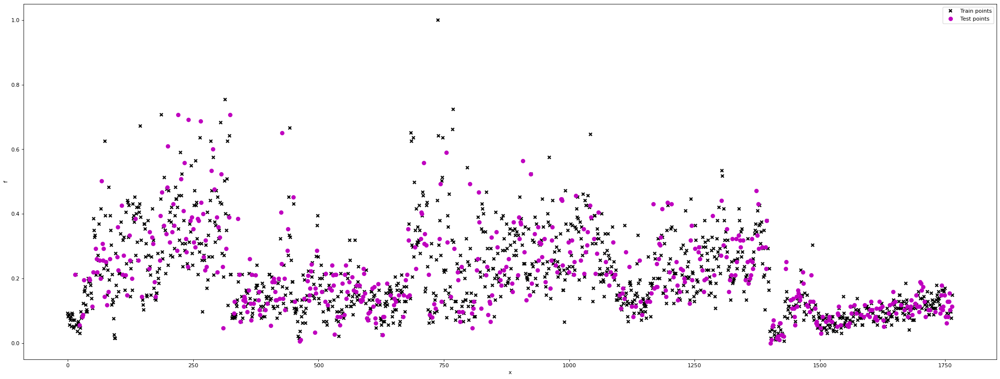

In [4]:
X = np.array(list(range(0,1765)))
# x = np.array(DKI1['Tanggal'])
X = X.reshape(-1,1)
Y = np.array(DKI1['O3'])
Y = Y.reshape(-1,1)

from sklearn.model_selection import train_test_split

train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size=0.3, random_state=42, shuffle=True)

# Plot observations
plt.figure(figsize=(32, 12), dpi=80)
plt.plot(train_X, train_Y, "kx", mew=2, label='Train points')
plt.plot(test_X, test_Y, "mo", mew=2, label='Test points')

# Annotate plot
plt.xlabel("x"), plt.ylabel("f")
plt.legend()

#### RBF Kernel
Optimizing kernel parameters

In [6]:
k1 = GPy.kern.RBF(1)
m1 = GPy.models.GPRegression(train_X, train_Y, k1)
m1.optimize()

In [7]:
m1

GP_regression.,value,constraints,priors
rbf.variance,0.03438526714917283,+ve,
rbf.lengthscale,14.574209548128877,+ve,
Gaussian_noise.variance,0.0076020718591604825,+ve,


In [8]:
plt.rc('figure', figsize=(64, 24), dpi=240)
m1.plot()
ax = plt.gca()
ax.plot(test_X, test_Y, "mo", mew=2, label="Test points")

ax.legend()

In [9]:
from sklearn import metrics

def print_evaluate(true, predicted):  
    mae = metrics.mean_absolute_error(true, predicted)
    mse = metrics.mean_squared_error(true, predicted)
    rmse = np.sqrt(metrics.mean_squared_error(true, predicted))
    r2_square = metrics.r2_score(true, predicted)
    print('MAE:', mae)
    print('MSE:', mse)
    print('RMSE:', rmse)
    print('R2 Square', r2_square)
    print('__________________________________')

In [10]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m1.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.04662197423391556
MSE: 0.0033245871788937275
RMSE: 0.05765923324927004
R2 Square -2.344769659268925
__________________________________


In [11]:
metrics.r2_score(train_Y.flatten(), m1.predict(train_X)[0].flatten())

0.5802979535689532

In [12]:
data_test = pd.DataFrame(test_Y.flatten(), columns=['Data Test'])
prediksi = pd.DataFrame(m1.predict(test_X)[0].flatten(), columns=['Prediksi'])
selisih = abs(test_Y.flatten() - m1.predict(test_X)[0].flatten())
selisih = pd.DataFrame(selisih, columns=['Selisih'])
pd.concat([data_test, prediksi, selisih], axis=1, join='inner')

,Data Test,Prediksi,Selisih
0,0.138462,0.130032,0.008429
1,0.128205,0.129901,0.001696
2,0.158974,0.129264,0.029711
3,0.138462,0.128105,0.010357
4,0.117949,0.126419,0.008471
5,0.092308,0.124213,0.031905
6,0.107692,0.121500,0.013808
7,0.148718,0.118308,0.030410
8,0.179487,0.114669,0.064818
9,0.164103,0.110625,0.053477


Periodic kernel

In [10]:
k2 = GPy.kern.StdPeriodic(1, period=2)
m2 = GPy.models.GPRegression(train_X, train_Y, k2)
m2.optimize()

In [11]:
m2

GP_regression.,value,constraints,priors
std_periodic.variance,0.42375065106121657,+ve,
std_periodic.period,2.007231854946179,+ve,
std_periodic.lengthscale,2.170334291414865,+ve,
Gaussian_noise.variance,0.01648308266612298,+ve,


In [12]:
m2.plot()
ax = plt.gca()
plt.rc('figure', figsize=(64, 24), dpi=240)
ax.plot(test_X, test_Y, "mo", mew=2, label='Test points')

ax.legend()

In [13]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m2.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.0952547342706153
MSE: 0.015318374327592714
RMSE: 0.1237674202994985
R2 Square 0.04254855395874135
__________________________________


Kombinasi 2 Kernel

In [14]:
k3 = k1+k2
k4 = k1*k2

In [15]:
m3 = GPy.models.GPRegression(train_X, train_Y, k3)
m3.optimize()
m3

GP_regression.,value,constraints,priors
sum.rbf.variance,0.008407137752788209,+ve,
sum.rbf.lengthscale,11.166987904864245,+ve,
sum.std_periodic.variance,0.021015307648027896,+ve,
sum.std_periodic.period,2.0257541257252045,+ve,
sum.std_periodic.lengthscale,11.281419830764987,+ve,
Gaussian_noise.variance,0.007386346710247129,+ve,


In [16]:
m3.plot()
ax = plt.gca()
plt.rc('figure', figsize=(64, 24), dpi=240)
ax.plot(test_X, test_Y, "mo", mew=2, label='Test points')

ax.legend()

In [17]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m3.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06131562828036679
MSE: 0.008140655462930845
RMSE: 0.09022558097862737
R2 Square 0.4911808408633084
__________________________________


In [18]:
m4 = GPy.models.GPRegression(train_X, train_Y, k4)
m4.optimize()
m4

GP_regression.,value,constraints,priors
mul.rbf.variance,0.008365486507012231,+ve,
mul.rbf.lengthscale,28.27170614472704,+ve,
mul.std_periodic.variance,4.1775870827499695,+ve,
mul.std_periodic.period,1.8503524371265017,+ve,
mul.std_periodic.lengthscale,467.2632997592545,+ve,
Gaussian_noise.variance,0.008290581493050554,+ve,


In [19]:
m4.plot()
ax = plt.gca()
plt.rc('figure', figsize=(64, 24), dpi=240)
ax.plot(test_X, test_Y, "mo", mew=2, label='Test points')

ax.legend()

In [20]:
print('Evaluation:\n_____________________________________')
print_evaluate(test_Y, m4.predict(test_X)[0].flatten())

Evaluation:
_____________________________________
MAE: 0.06376029818841629
MSE: 0.008216300568746221
RMSE: 0.0906438115303313
R2 Square 0.48645275977585145
__________________________________
